<h1 id="tocheading">Table of Contents</h1>
<div id="toc"></div>

In [1]:
%%javascript
$.getScript('https://kmahelona.github.io/ipython_notebook_goodies/ipython_notebook_toc.js')

<IPython.core.display.Javascript object>

# Modules and plotting functions

In [1]:
%matplotlib inline
import numpy as np
from nilearn import plotting
import matplotlib.pyplot as plt
import os
import nibabel as nib
from mapalign import embed, dist, align
import glob
from scipy import stats, linalg
import pandas as pd
#import scikits.statsmodels.api as sm
from sklearn import mixture
from IPython.core.display import Image, display
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import matplotlib as mpl
import matplotlib.gridspec as gridspec
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.path import Path
import matplotlib.patches as patches
import h5py as h5
import itertools
mpl.use('Agg')
plt.rcParams['backend'] = 'TkAgg'
plt.rcParams['image.cmap'] = 'jet'


font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 36}

mpl.rc('font', **font)

from matplotlib.colors import ListedColormap

sns.set_context('poster')
sns.set(style="whitegrid")
sns.set_palette("husl")

import time

/usr/local/lib/python2.7/site-packages/matplotlib/__init__.py:1350: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


In [2]:
def plot_surf_stat_map(coords, faces, stat_map=None,
                       elev=0, azim=0,
                       cmap='jet',
                       threshold=None, bg_map=None,
                       bg_on_stat=False,
                       alpha='auto',
                       vmin=None, vmax=None,
                       cbar='sequential', # or'diverging'
                       symmetric_cbar="auto",
                       figsize=None,
                       labels=None, label_col=None, label_cpal=None,
                       mask=None, mask_lenient=None,
                       **kwargs):
    '''
    https://github.com/juhuntenburg/nilearn/tree/enh/surface_plotting
    Helper function for symmetric colormap is copied from nilearn.
    '''
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.tri as tri
    from mpl_toolkits.mplot3d import Axes3D
    import seaborn as sns
    
    # load mesh and derive axes limits
    faces = np.array(faces, dtype=int)
    limits = [coords.min(), coords.max()]

    # set alpha if in auto mode
    if alpha == 'auto':
        if bg_map is None:
            alpha = .5
        else:
            alpha = 1

    # if cmap is given as string, translate to matplotlib cmap
    if type(cmap) == str:
        cmap = plt.cm.get_cmap(cmap)

    # initiate figure and 3d axes
    if figsize is not None:
        fig = plt.figure(figsize=figsize)
    else:
        fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d', xlim=limits, ylim=limits)
    ax.view_init(elev=elev, azim=azim)
    ax.set_axis_off()

    # plot mesh without data
    p3dcollec = ax.plot_trisurf(coords[:, 0], coords[:, 1], coords[:, 2],
                                triangles=faces, linewidth=0.,
                                antialiased=False,
                                color='white')

    # where mask is indices of nodes to include:
    if mask is not None:    
        cmask = np.zeros(len(coords))
        cmask[mask] = 1
        cutoff = 2 # include triangles in cortex only if ALL nodes in mask
        if mask_lenient: # include triangles in cortex if ANY are in mask
            cutoff = 0
        fmask = np.where(cmask[faces].sum(axis=1) > cutoff)[0]    
    
    
    # If depth_map and/or stat_map are provided, map these onto the surface
    # set_facecolors function of Poly3DCollection is used as passing the
    # facecolors argument to plot_trisurf does not seem to work
    if bg_map is not None or stat_map is not None:

        face_colors = np.ones((faces.shape[0], 4))
        face_colors[:, :3] = .5*face_colors[:, :3]

        if bg_map is not None:
            bg_data = bg_map
            if bg_data.shape[0] != coords.shape[0]:
                raise ValueError('The bg_map does not have the same number '
                                 'of vertices as the mesh.')
            bg_faces = np.mean(bg_data[faces], axis=1)
            bg_faces = bg_faces - bg_faces.min()
            bg_faces = bg_faces / bg_faces.max()
            face_colors = plt.cm.gray_r(bg_faces)

        # modify alpha values of background
        face_colors[:, 3] = alpha*face_colors[:, 3]

        if stat_map is not None:
            stat_map_data = stat_map
            stat_map_faces = np.mean(stat_map_data[faces], axis=1)

            if cbar is 'diverging':
                print cbar
                # Call _get_plot_stat_map_params to derive symmetric vmin and vmax
                # And colorbar limits depending on symmetric_cbar settings
                cbar_vmin, cbar_vmax, vmin, vmax = \
                    _get_plot_stat_map_params(stat_map_faces, vmax,
                                              symmetric_cbar, kwargs)
            if cbar is 'sequential':
                if vmin is None:
                    vmin = stat_map_data.min()
                if vmax is None:
                    vmax = stat_map_data.max()

            if threshold is not None:
                kept_indices = np.where(abs(stat_map_faces) >= threshold)[0]
                stat_map_faces = stat_map_faces - vmin
                stat_map_faces = stat_map_faces / (vmax-vmin)
                if bg_on_stat:
                    face_colors[kept_indices] = cmap(stat_map_faces[kept_indices]) * face_colors[kept_indices]
                else:
                    face_colors[kept_indices] = cmap(stat_map_faces[kept_indices])
            else:
                stat_map_faces = stat_map_faces - vmin
                stat_map_faces = stat_map_faces / (vmax-vmin)
                if bg_on_stat:
                    if mask is not None:
                        face_colors[fmask] = cmap(stat_map_faces)[fmask] * face_colors[fmask]
                    else:
                        face_colors = cmap(stat_map_faces) * face_colors
                else:
                    if mask is not None:
                        face_colors[fmask] = cmap(stat_map_faces)[fmask] 
                        
                    else:
                        face_colors = cmap(stat_map_faces)

        if labels is not None:
            '''
            labels requires a tuple of label/s, each a list/array of node indices
            ----------------------------------------------------------------------
            color palette for labels
            if label_cpal is None, outlines will be black
            if it's a color palette name, a different color for each label will be generated
            if it's a list of rgb or color names, these will be used
            valid color names from http://xkcd.com/color/rgb/
            '''
            if label_cpal is not None:
                if label_col is not None:
                    raise ValueError("Don't use label_cpal and label_col together.")         
                if type(label_cpal) == str:
                    cpal = sns.color_palette(label_cpal, len(labels))
                if type(label_cpal) == list:
                    if len(label_cpal) < len(labels):
                        raise ValueError('There are not enough colors in the color list.')
                    try:
                        cpal = sns.color_palette(label_cpal)
                    except:
                        cpal = sns.xkcd_palette(label_cpal)
        
            
                
            
            for n_label, label in enumerate(labels):
                for n_face, face in enumerate(faces):
                    count = len(set(face).intersection(set(label)))
                    if (count > 0) & (count < 3):
                        if label_cpal is None:
                            if label_col is not None:
                                face_colors[n_face,0:3] = sns.xkcd_palette([label_col])[0]
                            else:
                                face_colors[n_face,0:3] = sns.xkcd_palette(["black"])[0]
                        else:
                            face_colors[n_face,0:3] = cpal[n_label]
                            
        p3dcollec.set_facecolors(face_colors)

    return fig


def _get_plot_stat_map_params(stat_map_data, vmax, symmetric_cbar, kwargs,
    force_min_stat_map_value=None):
    import numpy as np
    """ Internal function for setting value limits for plot_stat_map and
    plot_glass_brain.
    The limits for the colormap will always be set to range from -vmax to vmax.
    The limits for the colorbar depend on the symmetric_cbar argument, please
    refer to docstring of plot_stat_map.
    """
    # make sure that the color range is symmetrical
    if vmax is None or symmetric_cbar in ['auto', False]:
        # Avoid dealing with masked_array:
        if hasattr(stat_map_data, '_mask'):
            stat_map_data = np.asarray(
                    stat_map_data[np.logical_not(stat_map_data._mask)])
        stat_map_max = np.nanmax(stat_map_data)
        if force_min_stat_map_value == None:
            stat_map_min = np.nanmin(stat_map_data)
        else:
            stat_map_min = force_min_stat_map_value
    if symmetric_cbar == 'auto':
        symmetric_cbar = stat_map_min < 0 and stat_map_max > 0
    if vmax is None:
        vmax = max(-stat_map_min, stat_map_max)
    if 'vmin' in kwargs:
        raise ValueError('this function does not accept a "vmin" '
            'argument, as it uses a symmetrical range '
            'defined via the vmax argument. To threshold '
            'the map, use the "threshold" argument')
    vmin = -vmax
    if not symmetric_cbar:
        negative_range = stat_map_max <= 0
        positive_range = stat_map_min >= 0
        if positive_range:
            cbar_vmin = 0
            cbar_vmax = None
        elif negative_range:
            cbar_vmax = 0
            cbar_vmin = None
        else:
            cbar_vmin = stat_map_min
            cbar_vmax = stat_map_max
    else:
        cbar_vmin, cbar_vmax = None, None
    return cbar_vmin, cbar_vmax, vmin, vmax
    

def plot_surf_label(coords, faces, 
                    labels=None,
                    elev=0, azim=0,
                    cpal='bright',
                    threshold=None, 
                    bg_map=None,
                    bg_on_labels=False,
                    alpha='auto',
                    figsize=None,
                    **kwargs):
    
    '''
    - labels requires a tuple of label/s, each a list/array of node indices
    - cpal takes either the name of a seaborn color palette or matplotlib color map, 
      or a list of rgb values or color names from http://xkcd.com/color/rgb/
    '''
    
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.tri as tri
    from mpl_toolkits.mplot3d import Axes3D
    import seaborn as sns
    
    # load mesh and derive axes limits
    faces = np.array(faces, dtype=int)
    limits = [coords.min(), coords.max()]

    # set alpha if in auto mode
    if alpha == 'auto':
        if bg_map is None:
            alpha = .5
        else:
            alpha = 1

    # if cap is given as string, translate to seaborn color palette
    if type(cpal) == str:
        cpal = sns.color_palette(cpal, len(labels))
    if type(cpal) == list:
        if len(cpal) < len(labels):
            raise ValueError('There are not enough colors in the color list.')
        try:
            cpal = sns.color_palette(cpal)
        except:
            cpal = sns.xkcd_palette(cpal)
    
    # initiate figure and 3d axes
    if figsize is not None:
        fig = plt.figure(figsize=figsize)
    else:
        fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d', xlim=limits, ylim=limits)
    ax.view_init(elev=elev, azim=azim)
    ax.set_axis_off()

    # plot mesh without data
    p3dcollec = ax.plot_trisurf(coords[:, 0], coords[:, 1], coords[:, 2],
                                triangles=faces, linewidth=0.,
                                antialiased=False,
                                color='white')

    if bg_map is not None or labels is not None:

        face_colors = np.ones((faces.shape[0], 4))
        face_colors[:, :3] = .5*face_colors[:, :3]

        if bg_map is not None:
            bg_data = bg_map
            if bg_data.shape[0] != coords.shape[0]:
                raise ValueError('The bg_map does not have the same number '
                                 'of vertices as the mesh.')
            bg_faces = np.mean(bg_data[faces], axis=1)
            bg_faces = bg_faces - bg_faces.min()
            bg_faces = bg_faces / bg_faces.max()    
            face_colors = plt.cm.gray_r(bg_faces)

        # modify alpha values of background
        face_colors[:, 3] = alpha*face_colors[:, 3]

        # color the labels, either overriding or overlaying bg_map
        if labels is not None:
            for n_label,label in enumerate(labels):
                for n_face, face in enumerate(faces):
                    count = len(set(face).intersection(set(label)))
                    if count > 1:
                        if bg_on_labels:
                            face_colors[n_face,0:3] = cpal[n_label] * face_colors[n_face,0:3]
                        else:
                            face_colors[n_face,0:3] = cpal[n_label]
            
        p3dcollec.set_facecolors(face_colors)

    return fig

    
def crop_img(fig, margin=10):
    # takes fig, returns image
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.image as mpimg
    import os
    
    fig.savefig('./tempimage', bbox_inches='tight', orientation='landscape')
    plt.close(fig)
    img = mpimg.imread('./tempimage.png')
    os.remove('./tempimage.png')    
    
    kept = {'rows':[], 'cols':[]}
    for row in range(img.shape[0]):
        if len(set(np.ndarray.flatten(img[row,:,:]))) > 1:
            kept['rows'].append(row)
    for col in range(img.shape[1]):
        if len(set(np.ndarray.flatten(img[:,col,:]))) > 1:
            kept['cols'].append(col)
    
    if margin:
        return img[min(kept['rows'])-margin:max(kept['rows'])+margin,
                   min(kept['cols'])-margin:max(kept['cols'])+margin]
    else:
        return img[kept['rows']][:,kept['cols']]
        
        


def create_fig(data=None, labels=None, label_col=None, 
               hemi=None, surf='pial',
               sulc=True, alpha='auto',
               cmap='jet', cpal='bright', cbar=False,
               dmin=None, dmax=None,
               mask=None, title=None):
    
    import nibabel as nib, numpy as np
    import matplotlib.pyplot as plt, matplotlib as mpl
    from IPython.core.display import Image, display
    import os     
    
    fsDir = '/Applications/freesurfer/subjects'
    surf_f = '%s/fsaverage4/surf/%s.%s' % (fsDir, hemi, surf)
    coords = nib.freesurfer.io.read_geometry(surf_f)[0]
    faces = nib.freesurfer.io.read_geometry(surf_f)[1]
    if sulc:
        sulc_f = '%s/fsaverage4/surf/%s.sulc' % (fsDir, hemi)
        sulc = nib.freesurfer.io.read_morph_data(sulc_f)
        sulc_bool = True
    else:
        sulc = None
        sulc_bool = False
      
    # create images
    imgs = []        
    for azim in [0, 180]:
        
        if data is not None:
            if dmin is None:
                dmin = data[np.nonzero(data)].min()
            if dmax is None:
                dmax = data.max()
            fig = plot_surf_stat_map(coords, faces, stat_map=data,
                                 elev=0, azim=azim,
                                 cmap=cmap,
                                 bg_map=sulc,bg_on_stat=sulc_bool,
                                 vmin=dmin, vmax=dmax,
                                 labels=labels, label_col=label_col,
                                 alpha=alpha,
                                 mask=mask, mask_lenient=False)
                                 #label_cpal=cpal)
        else:
            fig = plot_surf_label(coords, faces, 
                                  labels=labels,
                                  elev=0, azim=azim,                             
                                  bg_map=sulc,
                                  cpal=cpal,
                                  bg_on_labels=sulc_bool,
                                  alpha=alpha)

        # crop image
        imgs.append((crop_img(fig, margin=5)),)
        plt.close(fig)

    # create figure with color bar
    fig = plt.figure()
    fig.set_size_inches(8, 4)

    #ax1 = plt.subplot2grid((4,60), (0,0),  colspan = 26, rowspan =4)
    ax = plt.subplot2grid((4,60), (0,0),  colspan = 26, rowspan =4)
    plt.imshow(imgs[0])
    #ax1.set_axis_off()
    ax.set_axis_off()

    #ax2 = plt.subplot2grid((4,60), (0,28),  colspan = 26, rowspan =4)
    ax = plt.subplot2grid((4,60), (0,28),  colspan = 26, rowspan =4)
    plt.imshow(imgs[1])
    #ax2.set_axis_off()
    ax.set_axis_off()
    
    if cbar==True and data is not None:  
        cax = plt.subplot2grid((4,60), (1,59),  colspan = 1, rowspan =2)
        cmap = plt.cm.get_cmap(cmap)
        norm = mpl.colors.Normalize(vmin=dmin, vmax=dmax)
        cb = mpl.colorbar.ColorbarBase(cax, cmap=cmap, norm=norm)
        cb.set_ticks([dmin, dmax])
        
    if title is not None:
        fig.suptitle(title)
    
    fig.savefig('./tempimage',dpi=150)
    plt.close(fig)
    display(Image(filename='./tempimage.png', width=800))
    os.remove('./tempimage.png')       
    
def create_fig_pdf(data=None, labels=None, label_col=None, 
               hemi=None, surf='pial',
               sulc=True, alpha='auto',
               cmap='jet', cpal='bright', cbar=False,
               dmin=None, dmax=None,
               mask=None, title=None):
    
    import nibabel as nib, numpy as np
    import matplotlib.pyplot as plt, matplotlib as mpl
    from IPython.core.display import Image, display
    import os     
    
    fsDir = '/Applications/freesurfer/subjects'
    surf_f = '%s/fsaverage4/surf/%s.%s' % (fsDir, hemi, surf)
    coords = nib.freesurfer.io.read_geometry(surf_f)[0]
    faces = nib.freesurfer.io.read_geometry(surf_f)[1]
    if sulc:
        sulc_f = '%s/fsaverage4/surf/%s.sulc' % (fsDir, hemi)
        sulc = nib.freesurfer.io.read_morph_data(sulc_f)
        sulc_bool = True
    else:
        sulc = None
        sulc_bool = False
      
    # create images
    imgs = []        
    for azim in [0, 180]:
        
        if data is not None:
            if dmin is None:
                dmin = data[np.nonzero(data)].min()
            if dmax is None:
                dmax = data.max()
            fig = plot_surf_stat_map(coords, faces, stat_map=data,
                                 elev=0, azim=azim,
                                 cmap=cmap,
                                 bg_map=sulc,bg_on_stat=sulc_bool,
                                 vmin=dmin, vmax=dmax,
                                 labels=labels, label_col=label_col,
                                 alpha=alpha,
                                 mask=mask, mask_lenient=False)
                                 #label_cpal=cpal)
        else:
            fig = plot_surf_label(coords, faces, 
                                  labels=labels,
                                  elev=0, azim=azim,                             
                                  bg_map=sulc,
                                  cpal=cpal,
                                  bg_on_labels=sulc_bool,
                                  alpha=alpha)

        # crop image
        imgs.append((crop_img(fig, margin=15)),)
        plt.close(fig)

    # create figure with color bar
    fig = plt.figure()
    fig.set_size_inches(8, 4)

    ax1 = plt.subplot2grid((4,60), (0,0),  colspan = 26, rowspan =4)
    plt.imshow(imgs[0])
    ax1.set_axis_off()

    ax2 = plt.subplot2grid((4,60), (0,28),  colspan = 26, rowspan =4)
    plt.imshow(imgs[1])
    ax2.set_axis_off()
    
    if cbar==True and data is not None:  
        cax = plt.subplot2grid((4,60), (1,59),  colspan = 1, rowspan =2)
        cmap = plt.cm.get_cmap(cmap)
        norm = mpl.colors.Normalize(vmin=dmin, vmax=dmax)
        cb = mpl.colorbar.ColorbarBase(cax, cmap=cmap, norm=norm)
        cb.set_ticks([dmin, dmax])
        
    if title is not None:
        fig.suptitle(title)
    
    pdf.savefig()
    plt.close(fig)

def create_fig_tojpeg(data=None, labels=None, label_col=None, 
               hemi=None, surf='pial',
               sulc=True, alpha='auto',
               cmap='jet', cpal='bright', cbar=False,
               dmin=None, dmax=None,
               mask=None, title=None, index = '', fname=None):
    
    import nibabel as nib, numpy as np
    import matplotlib.pyplot as plt, matplotlib as mpl
    from IPython.core.display import Image, display
    import os     
    
    fsDir = '/Applications/freesurfer/subjects'
    surf_f = '%s/fsaverage4/surf/%s.%s' % (fsDir, hemi, surf)
    coords = nib.freesurfer.io.read_geometry(surf_f)[0]
    faces = nib.freesurfer.io.read_geometry(surf_f)[1]
    if sulc:
        sulc_f = '%s/fsaverage4/surf/%s.sulc' % (fsDir, hemi)
        sulc = nib.freesurfer.io.read_morph_data(sulc_f)
        sulc_bool = True
    else:
        sulc = None
        sulc_bool = False
      
    # create images
    imgs = []        
    for azim in [0, 180]:
        
        if data is not None:
            if dmin is None:
                dmin = data[np.nonzero(data)].min()
            if dmax is None:
                dmax = data.max()
            fig = plot_surf_stat_map(coords, faces, stat_map=data,
                                 elev=0, azim=azim,
                                 cmap=cmap,
                                 bg_map=sulc,bg_on_stat=sulc_bool,
                                 vmin=dmin, vmax=dmax,
                                 labels=labels, label_col=label_col,
                                 alpha=alpha,
                                 mask=mask, mask_lenient=False)
                                 #label_cpal=cpal)
        else:
            fig = plot_surf_label(coords, faces, 
                                  labels=labels,
                                  elev=0, azim=azim,                             
                                  bg_map=sulc,
                                  cpal=cpal,
                                  bg_on_labels=sulc_bool,
                                  alpha=alpha)

        # crop image
        imgs.append((crop_img(fig, margin=15)),)
        plt.close(fig)

    # create figure with color bar
    fig = plt.figure()
    fig.set_size_inches(8, 4)

    ax1 = plt.subplot2grid((4,60), (0,0),  colspan = 26, rowspan =4)
    plt.imshow(imgs[0])
    ax1.set_axis_off()

    ax2 = plt.subplot2grid((4,60), (0,28),  colspan = 26, rowspan =4)
    plt.imshow(imgs[1])
    ax2.set_axis_off()
    
    if cbar==True and data is not None:  
        cax = plt.subplot2grid((4,60), (1,59),  colspan = 1, rowspan =2)
        cmap = plt.cm.get_cmap(cmap)
        norm = mpl.colors.Normalize(vmin=dmin, vmax=dmax)
        cb = mpl.colorbar.ColorbarBase(cax, cmap=cmap, norm=norm)
        cb.set_ticks([dmin, dmax])
        
    if title is not None:
        fig.suptitle(title)
    
    plt.savefig(fname + str(index) + ".png",dpi=300)
    plt.close(fig)

In [3]:
def create_dense_fig(data=None, data_realigned=None, n_comps=3,
               labels=None, label_col=None, 
               hemi=None, surf='inflated',
               sulc=True, alpha='auto',
               cmap='jet', cpal='bright', cbar=False,
               dmin=None, dmax=None,
               mask=None, title=None,
               pdf=None, subj=None):
    
    import nibabel as nib, numpy as np
    import matplotlib.pyplot as plt, matplotlib as mpl
    import matplotlib.gridspec as gridspec
    from IPython.core.display import Image, display
    import os
    from matplotlib.backends.backend_pdf import PdfPages
    
    coords = {'lh':None,'rh':None}
    faces={'lh':None, 'rh':None}
    sulc={'lh': None, 'rh':None}
    ind={'lh': range(2562), 'rh': range(2562,5124)}
    
    fsDir = '/Applications/freesurfer/subjects'
    surf_f_lh = '%s/fsaverage4/surf/lh.%s' % (fsDir, surf)
    surf_f_rh = '%s/fsaverage4/surf/rh.%s' % (fsDir, surf)
    coords['lh'] = nib.freesurfer.io.read_geometry(surf_f_lh)[0]
    faces['lh'] = nib.freesurfer.io.read_geometry(surf_f_lh)[1]
    coords['rh'] = nib.freesurfer.io.read_geometry(surf_f_rh)[0]
    faces['rh'] = nib.freesurfer.io.read_geometry(surf_f_rh)[1]    
    
    if sulc:
        sulc_f_lh = '%s/fsaverage4/surf/lh.sulc' % (fsDir)
        sulc_f_rh = '%s/fsaverage4/surf/rh.sulc' % (fsDir)
        sulc['lh'] = nib.freesurfer.io.read_morph_data(sulc_f_lh)
        sulc['rh'] = nib.freesurfer.io.read_morph_data(sulc_f_rh)
        sulc_bool = True
    else:
        sulc = None
        sulc_bool = False

    if dmin is None:
        dmin_calc = True
    else:
        dmin_calc = False
        
    if dmax is None:
        dmax_calc = True
    else:
        dmax_calc = False
    

    # create images
    imgs = []
    dmins = []
    dmaxs = []
    for c in range(n_comps):
        for hemi in ['lh','rh']:
            for azim in [0, 180]:

                if data is not None:
                    if dmin_calc is True:
                        dmin = data[:,c].min()
                        dmins.append(dmin)
                    if dmax_calc is True:
                        dmax = data[:,c].max()
                        dmaxs.append(dmax)
                    fig = plot_surf_stat_map(coords[hemi], faces[hemi], stat_map=data[ind[hemi],c],
                                         elev=0, azim=azim,
                                         cmap=cmap,
                                         bg_map=sulc[hemi], bg_on_stat=sulc_bool,
                                         vmin=dmin, vmax=dmax,
                                         labels=labels, label_col=label_col,
                                         alpha=alpha,
                                         mask=mask, mask_lenient=False)
                                         #label_cpal=cpal)
                else:
                    fig = plot_surf_label(coords[hemi], faces[hemi], 
                                              labels=labels,
                                              elev=0, azim=azim,                             
                                              bg_map=sulc[hemi],
                                              cpal=cpal,
                                              bg_on_labels=sulc_bool,
                                              alpha=alpha)

                # crop image
                imgs.append((crop_img(fig, margin=15)),)
                plt.close(fig)

      
            for azim in [0, 180]:
                if data_realigned is not None:
                    if dmin_calc is True:
                        dmin = data_realigned[:,c].min()
                        dmins.append(dmin)
                    if dmax_calc is True:
                        dmax = data_realigned[:,c].max()
                        dmaxs.append(dmax)
                    fig = plot_surf_stat_map(coords[hemi], faces[hemi], stat_map=data_realigned[ind[hemi],c],
                                         elev=0, azim=azim,
                                         cmap=cmap,
                                         bg_map=sulc[hemi], bg_on_stat=sulc_bool,
                                         vmin=dmin, vmax=dmax,
                                         labels=labels, label_col=label_col,
                                         alpha=alpha,
                                         mask=mask, mask_lenient=False)
                                         #label_cpal=cpal)
                else:
                        fig = plot_surf_label(coords[hemi], faces[hemi], 
                                              labels=labels,
                                              elev=0, azim=azim,                             
                                              bg_map=sulc[hemi],
                                              cpal=cpal,
                                              bg_on_labels=sulc_bool,
                                              alpha=alpha)

                # crop image
                imgs.append((crop_img(fig, margin=15)),)
                plt.close(fig)                


    # create figure with color bar
    fig = plt.figure()
    fig.set_size_inches(10, 3*n_comps+10)                  

    nrows = 8*n_comps+2+15
    ncols = 150
    
    ax = plt.subplot2grid((nrows, ncols), (0,38),  colspan = 20, rowspan =1)
    ax.axes.get_yaxis().set_visible(False)
    ax.axes.get_xaxis().set_visible(False)
    plt.axis('off')
    plt.text(0, 0, 'Raw', ha='center', va='center', size=20, alpha=.5)
    
    ax = plt.subplot2grid((nrows, ncols), (0,110),  colspan = 20, rowspan =1)
    ax.axes.get_yaxis().set_visible(False)
    ax.axes.get_xaxis().set_visible(False)
    plt.axis('off')
    plt.text(0, 0, 'After Procrustes', ha='center', va='center', size=20, alpha=.5) 

    for i in range(len(imgs)):
        row = int(np.floor(i/4))
        col = np.mod(i,4)
        comp = int(np.floor(i/8))
        r = 2+row*4
        c = col*30 + int(np.round((col+1)/4.))*10 + 10
        ax = plt.subplot2grid((nrows, ncols), (r,c),  colspan = 26, rowspan =4)
        plt.imshow(imgs[i])
        ax.set_axis_off()
        #print "i = %d, comp %d, row %d, col %d" % (i, comp,  row, col)
        
        
        if i == (1 + comp*8) and cbar == True:
            cax = plt.subplot2grid((nrows,ncols), (3+row*4,67),  colspan = 2, rowspan = 6)
            cmap = plt.cm.get_cmap(cmap)
            norm = mpl.colors.Normalize(vmin=dmins[i], vmax=dmaxs[i])
            cb = mpl.colorbar.ColorbarBase(cax, cmap=cmap, norm=norm)
            cb.set_ticks([dmins[i], dmaxs[i]])
            
            ax = plt.subplot2grid((nrows, ncols), (3+row*4,0),  colspan = 2, rowspan = 6)
            ax.axes.get_yaxis().set_visible(False)
            ax.axes.get_xaxis().set_visible(False)
            plt.axis('off')
            plt.text(0, 0, "Diffusion map %d" % (comp+1), ha='center', va='bottom', rotation='vertical', size=18, alpha=.5)           
        
        if i == (3 + comp*8) and cbar == True:
            cax = plt.subplot2grid((nrows,ncols), (3+row*4,137),  colspan = 2, rowspan = 6)
            cmap = plt.cm.get_cmap(cmap)
            norm = mpl.colors.Normalize(vmin=dmins[i], vmax=dmaxs[i])
            cb = mpl.colorbar.ColorbarBase(cax, cmap=cmap, norm=norm)
            cb.set_ticks([dmins[i], dmaxs[i]])            
    
    if subj is not None:
        cormat = np.load("corrmats/3back/subject%d_3back.npy" % subj)
        ax = plt.subplot2grid((nrows, ncols), (8*n_comps+3,0),  colspan = 150, rowspan = 15)
        cax = ax.matshow(cormat, cmap=cmap)
        plt.colorbar(cax)

    if title is not None:
        fig.suptitle(title, fontsize=20, alpha=0.8)
    
    #plt.tight_layout()
    
    if pdf is not None:
        #pp = PdfPages(fname)
        pdf.savefig()
        #pp.close()
        plt.close(fig)
    else:
        fig.savefig('./tempimage',dpi=150)
        plt.close(fig)
        display(Image(filename='./tempimage.png', width=800))
        os.remove('./tempimage.png')   

In [4]:
def create_template_fig(data=None, data_realigned=None, n_comps=3,
               labels=None, label_col=None, 
               hemi=None, surf='inflated',
               sulc=True, alpha='auto',
               cmap='jet', cpal='bright', cbar=False,
               dmin=None, dmax=None,
               mask=None, title=None,
               pdf=None, subj=None):
    
    import nibabel as nib, numpy as np
    import matplotlib.pyplot as plt, matplotlib as mpl
    import matplotlib.gridspec as gridspec
    from IPython.core.display import Image, display
    import os
    from matplotlib.backends.backend_pdf import PdfPages
    
    coords = {'lh':None,'rh':None}
    faces={'lh':None, 'rh':None}
    sulc={'lh': None, 'rh':None}
    ind={'lh': range(2562), 'rh': range(2562,5124)}
    
    fsDir = '/Applications/freesurfer/subjects'
    surf_f_lh = '%s/fsaverage4/surf/lh.%s' % (fsDir, surf)
    surf_f_rh = '%s/fsaverage4/surf/rh.%s' % (fsDir, surf)
    coords['lh'] = nib.freesurfer.io.read_geometry(surf_f_lh)[0]
    faces['lh'] = nib.freesurfer.io.read_geometry(surf_f_lh)[1]
    coords['rh'] = nib.freesurfer.io.read_geometry(surf_f_rh)[0]
    faces['rh'] = nib.freesurfer.io.read_geometry(surf_f_rh)[1]    
    
    if sulc:
        sulc_f_lh = '%s/fsaverage4/surf/lh.sulc' % (fsDir)
        sulc_f_rh = '%s/fsaverage4/surf/rh.sulc' % (fsDir)
        sulc['lh'] = nib.freesurfer.io.read_morph_data(sulc_f_lh)
        sulc['rh'] = nib.freesurfer.io.read_morph_data(sulc_f_rh)
        sulc_bool = True
    else:
        sulc = None
        sulc_bool = False

    if dmin is None:
        dmin_calc = True
    else:
        dmin_calc = False
        
    if dmax is None:
        dmax_calc = True
    else:
        dmax_calc = False
    

    # create images
    imgs = []
    dmins = []
    dmaxs = []
    for c in range(n_comps):
        for hemi in ['lh','rh']:
            for azim in [0, 180]:

                if data is not None:
                    if dmin_calc is True:
                        dmin = data[:,c].min()
                        dmins.append(dmin)
                    if dmax_calc is True:
                        dmax = data[:,c].max()
                        dmaxs.append(dmax)
                    fig = plot_surf_stat_map(coords[hemi], faces[hemi], stat_map=data[ind[hemi],c],
                                         elev=0, azim=azim,
                                         cmap=cmap,
                                         bg_map=sulc[hemi], bg_on_stat=sulc_bool,
                                         vmin=dmin, vmax=dmax,
                                         labels=labels, label_col=label_col,
                                         alpha=alpha,
                                         mask=mask, mask_lenient=False)
                                         #label_cpal=cpal)
                else:
                    fig = plot_surf_label(coords[hemi], faces[hemi], 
                                              labels=labels,
                                              elev=0, azim=azim,                             
                                              bg_map=sulc[hemi],
                                              cpal=cpal,
                                              bg_on_labels=sulc_bool,
                                              alpha=alpha)

                # crop image
                imgs.append((crop_img(fig, margin=15)),)
                plt.close(fig)          


    # create figure with color bar
    fig = plt.figure()
    fig.set_size_inches(10, 3*n_comps)                  

    nrows = 16*n_comps
    ncols = 150
    
    for i in range(len(imgs)):
        row = int(np.floor(i/2))
        col = np.mod(i,2)
        comp = int(np.floor(i/4))
        r = row*8
        c = col*70 + 10
        ax = plt.subplot2grid((nrows, ncols), (r,c),  colspan = 52, rowspan = 8)
        plt.imshow(imgs[i])
        ax.set_axis_off()
        #print "i = %d, comp %d, row %d, col %d" % (i, comp,  row, col)
        
        
        if i == (1 + comp*4) and cbar == True:
            #print 'Yay!'
            cax = plt.subplot2grid((nrows,ncols), (1+row*8,137),  colspan = 2, rowspan = 14)
            cmap = plt.cm.get_cmap(cmap)
            norm = mpl.colors.Normalize(vmin=dmins[i], vmax=dmaxs[i])
            cb = mpl.colorbar.ColorbarBase(cax, cmap=cmap, norm=norm)
            cb.set_ticks([dmins[i], dmaxs[i]])
            
            ax = plt.subplot2grid((nrows, ncols), (row*8,0),  colspan = 2, rowspan = 14)
            ax.axes.get_yaxis().set_visible(False)
            ax.axes.get_xaxis().set_visible(False)
            plt.axis('off')
            plt.text(0, 0, "Diffusion map %d" % (comp+1), ha='center', va='bottom', rotation='vertical', size=18, alpha=.5)           
    


    if title is not None:
        fig.suptitle(title, fontsize=20, alpha=0.8)
    
    #plt.tight_layout()
    
    if pdf is not None:
        #pp = PdfPages(fname)
        pdf.savefig()
        #pp.close()
        plt.close(fig)
    else:
        fig.savefig('./tempimage',dpi=150)
        plt.close(fig)
        display(Image(filename='./tempimage.png', width=800))
        os.remove('./tempimage.png')   

In [5]:
# Read indices of cortical vertices to remove medial wall
lhcort = np.sort(nib.freesurfer.io.read_label('/Applications/freesurfer/subjects/fsaverage4/label/lh.cortex.label'))
# For right hemi we need to add 2562 to indices, because Satra's pipeline stores timecourses in a single file
rhcort = np.sort(nib.freesurfer.io.read_label('/Applications/freesurfer/subjects/fsaverage4/label/rh.cortex.label'))+2562
cortex = np.hstack([lhcort,rhcort])

subcortical = range(5124,7126)

vv = np.concatenate([cortex, subcortical])

# Construction of affinity matrix

## Load example correlation matrix

The following correlation matrix has size 6663 x 6663, with 4661 rows and columns corresponding to cortical surface (fsaverage4, top-left part of the matrix) and 2002 columns and rows corresponding to subcortical voxels (bottom-right part of the matrix).

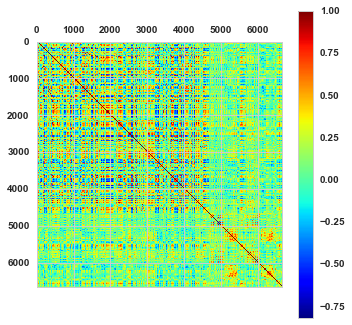

In [5]:
i = 0
cmat_3b = np.load('corrmats/3back/subject%d_3back.npy' % i)
plt.matshow(cmat_3b, cmap='jet')
plt.colorbar()

## Affinity matrix construction options

In order to perform diffusion embedding, we need to have a matrix that is 1) symmetrical 2) positive-definite. Correlation matrices do not satisfy property 2. Therefore we are faced with several options here:
1. Compute similarity between timecourses based on different metric (eta-squared, distance correlation etc.)
2. Compute spatial similarity between each voxel/vertex connectivity with the rest of the brain.

Which of these options is appropriate for which situations remains to be resolved. Below I present a few options and their practical consequences in terms of what the result looks like.

### Option 1: rescale the correlation matrix

Nothing changes in the structure of the matrix, just the scale.

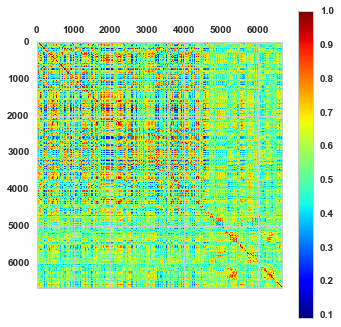

In [6]:
aff_3b_rescaled = (cmat_3b+1)/2
plt.matshow(aff_3b_rescaled, cmap = 'jet')
plt.colorbar()

### Option 2: compute affinity usign Euclidean distances and Gaussian kernel

Here we first compute the Euclidean distance between points and then use the Gaussian kernel to quantify the similarity. This is controlled by parameter epsilon (eps). If the Euclidean distance between a pair of rows is much larger than eps, then the affinity will be close to 0. Conversely, if the distance is much smaller than eps, the affinity will be close to 1.

#### Default eps calculated from the data

Sigma was set to 197.678503


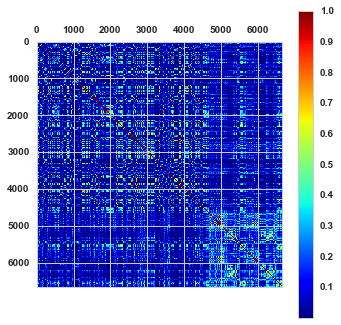

In [7]:
aff_3b = dist.compute_affinity(cmat_3b)
plt.matshow(aff_3b, cmap='jet')
plt.colorbar()

#### Smaller eps

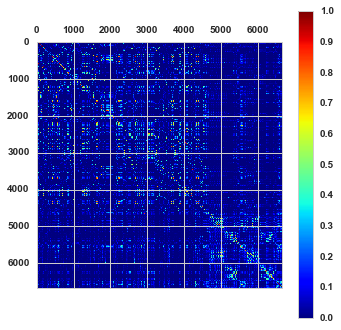

In [9]:
aff_3b = dist.compute_affinity(cmat_3b, eps = 100)
plt.matshow(aff_3b, cmap='jet')
plt.colorbar()

#### Higher eps

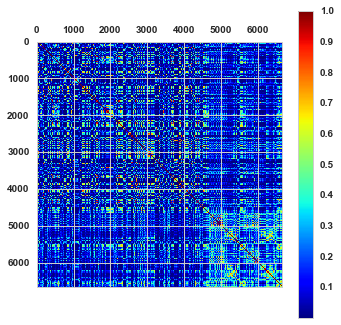

In [8]:
aff_3b = dist.compute_affinity(cmat_3b, eps = 250)
plt.matshow(aff_3b, cmap='jet')
plt.colorbar()

As it can be nicely seen, with eps parameter we can control the sparsity of the affinity matrix. How the choice of eps affects end results remains to be resolved. For the following parts of the example, we will use the default eps calculated from the data.

# Construction of Markov/transition matrix

## Diffusion operator

Diffusion operator ⍺ can take three values: 0, 0.5 and 1. For ⍺ = 0, the diffusion map becomes a Laplacian eigenmap, since the only operation performed on the affinity matrix is normalizing the rows so that they sum to 1. Values ⍺ = 0.5 and ⍺ = 1 induce the approximation of, respectively, Fokker-Planck and Laplace-Beltrami diffusion operators on the graph. Since I have not found any natural-language description of how these operators affect the graph, my intuition is based solely on observing the consequences of applying different operator values on the same graph. It seems that by setting the diffusion operator to a particular value we can manipulate the influence of the density on the eigenspectrum. Higher values of alpha induce more uniform diffusion over the graph. Coifman & Lafon (2006) say that if ⍺ = 0, then the influence of the density is maximal. For ⍺ = 0.5 they state that 'the Markov chain is an approximation of the diffusion of a Fokker–Planck
equation, allowing to approximate the long-time behavior or the point distribution of a system described by a certain stochastic differential equation'. For ⍺ = 1, 'one is able to recover the Riemannian geometry of the data set, regardless of the distribution of the points'. The practical consequences of the choice of diffusion operator will be assessed further.

### ⍺ = 0

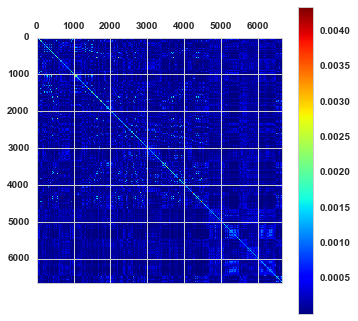

In [80]:
tm_a0 = embed.compute_markov_matrix(aff_3b, alpha = 0)
plt.matshow(tm_a0,cmap='jet')
plt.colorbar()

### ⍺ = 0.5

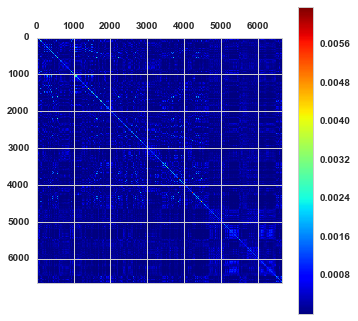

In [81]:
tm_a05 = embed.compute_markov_matrix(aff_3b, alpha = 0.5)
plt.matshow(tm_a05,cmap='jet')
plt.colorbar()

### ⍺ = 1

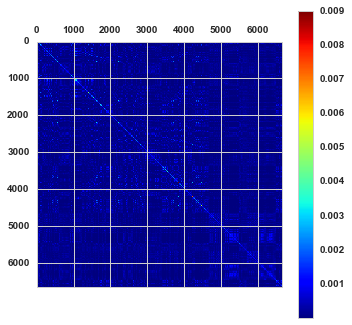

In [84]:
tm_a1 = embed.compute_markov_matrix(aff_3b, alpha = 1)
plt.matshow(tm_a1, cmap='jet')
plt.colorbar()

## Diffusion time

By setting the diffusion time to higher values we can modify the transition probabilities between points. In practical terms, using the diffusion time t raises the Markov matrix D to the 2tth power. The smaller the transition probability, the quicker it will approach zero. With t = 3 or 4, with brain connectivity data we get very close to zero for all values. In other words, with higher values of t the diffusion becomes more and more uniform, as is expected from a heat kernel. This is another parameter affecting how the diffusion process is modeled on the graph.

# Embedding

Here I assume that we have chosen to use eps = 200 when constructing affinity matrix based on full (non-thresholded) correlation matrices, set the diffusion operator alpha at 0.5 and stay within diffusion time 0, so we do not move the Markov Chain forward in time. 

# Realignment

## Procrustes as implemented in mapalign

The realignment is performed with 20 iterations and is based on 20 components for each subject.

#### Get the embedding

In [22]:
embeddings_3b = []
for i in range(29):
    emb = np.load('maps/3back/subject%d_embedding.npy' % i)
    embeddings_3b.append(emb[0])

#### Realign

In [23]:
e3b_realigned, e3b_xfms, e3b_target = align.iterative_alignment(embeddings_3b, n_iters=20)
e3b_native = np.array(embeddings_3b)
e3b_realigned = np.array(e3b_realigned)
e3b_xfms = np.array(e3b_xfms)

#### Get back the correspondence to fsa4

In [24]:
e3b_native_fs4 = np.zeros([29,7126,20])
e3b_realigned_fs4 = np.zeros([29,7126,20])
e3b_template_fs4 = np.zeros([7126,20])

e3b_native_fs4[:,vv,:] = e3b_native
e3b_realigned_fs4[:,vv,:] = e3b_realigned
e3b_template_fs4[vv,:] = e3b_target

#### Plot the template

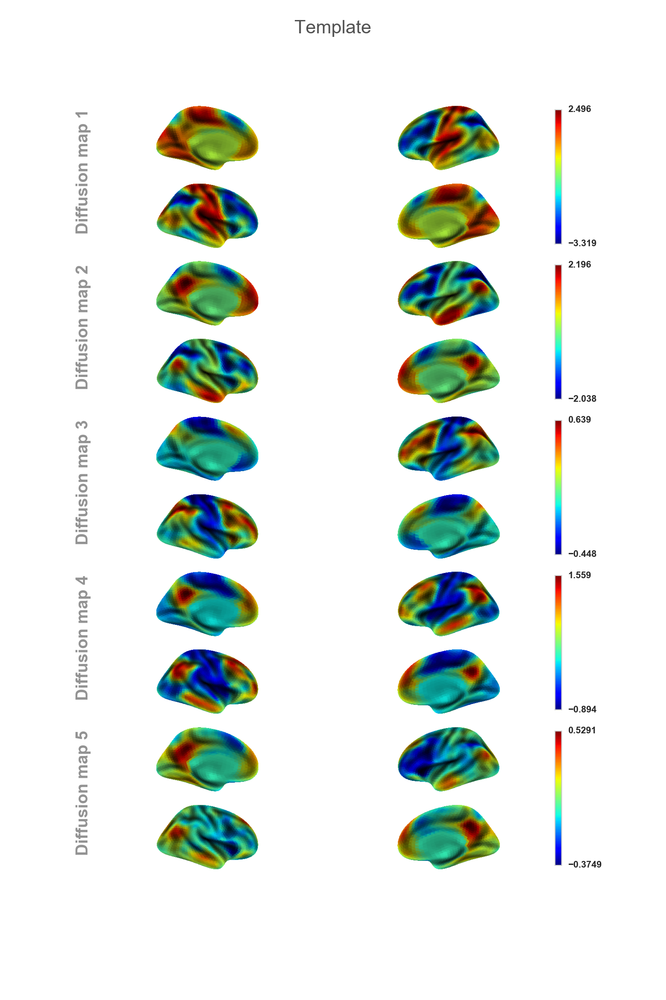

In [133]:
create_template_fig(e3b_template_fs4[0:5124,:], n_comps=5, cbar=True, title = "Template")

#### Plot the result for example subject

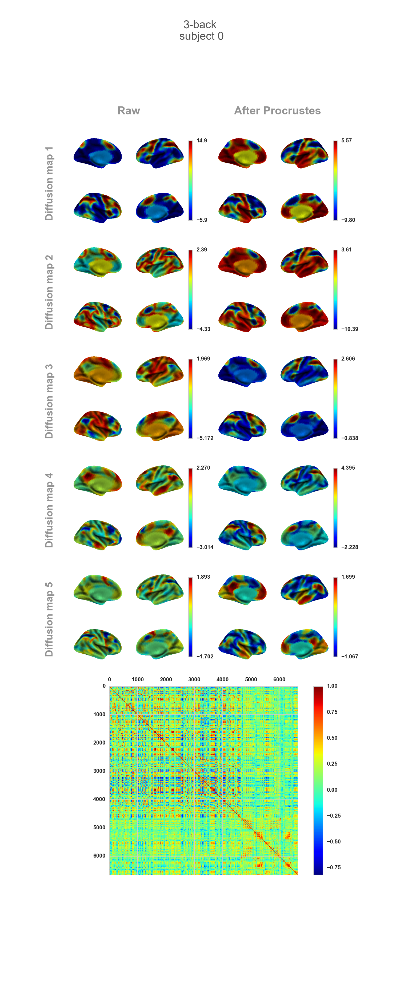

In [134]:
i = 0
create_dense_fig(e3b_native_fs4[i,0:5124,:], e3b_realigned_fs4[i,0:5124,:], cbar=True, n_comps=5, title = "3-back\n subject %d" % i, subj = i)

#### Generate PDF report

The above procedure replicates the behavior of Procrustes alignment in which it 'duplicates' the first template map.

## Procrustes with fewer dimensions

I have used first 20 eigenvectors for the initial analysis which shows that Procrustes can do weird stuff to the components. However, I am using relatively little amount of data (just 180 TRs from single-shot EPI), so it is questionable whether further components represent anything meaningful. To test this, we could have a look at scree plots of the eigenvalues.

#### Get lambdas

In [88]:
lambdas_3b = []
for i in range(29):
    emb = np.load('maps/3back/subject%d_embedding.npy' % i)
    lambdas_3b.append(emb[1]['lambdas'])
lambdas_3b = np.array(lambdas_3b)

#### Plot the lambdas

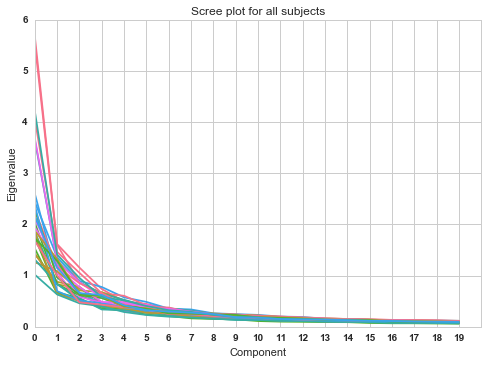

In [96]:
_ = plt.plot(range(20), lambdas_3b.T)
_ = plt.xticks(range(20))
_ = plt.xlabel("Component")
_ = plt.ylabel("Eigenvalue")
_ = plt.title("Scree plot for all subjects")

As can be seen from the above plot, 3-4 components might be meaningful, but the remaining ones are unlikely to represent anything meaningful. Thus, it might be interesting to try to do the realignment using only 5 first components.

### Realign with 5 dimensions

#### Load data

In [98]:
embeddings_3b_5d = []
for i in range(29):
    emb = np.load('maps/3back/subject%d_embedding.npy' % i)
    embeddings_3b_5d.append(emb[0][:,0:5])

#### Realign

In [99]:
e3b_5d_realigned, e3b_5d_xfms, e3b_5d_target = align.iterative_alignment(embeddings_3b_5d, n_iters=20)
#e3b_native = np.array(embeddings_3b_5d) # we have this already
e3b_5d_realigned = np.array(e3b_realigned)
e3b_5d_xfms = np.array(e3b_xfms)

#### Get back to original space

In [128]:
e3b_5d_realigned_fs4 = np.zeros([29,7126,20])
e3b_5d_template_fs4 = np.zeros([7126,20])

e3b_5d_realigned_fs4[:,vv,:] = e3b_realigned
e3b_5d_template_fs4[vv,:] = e3b_target

#### Plot the template

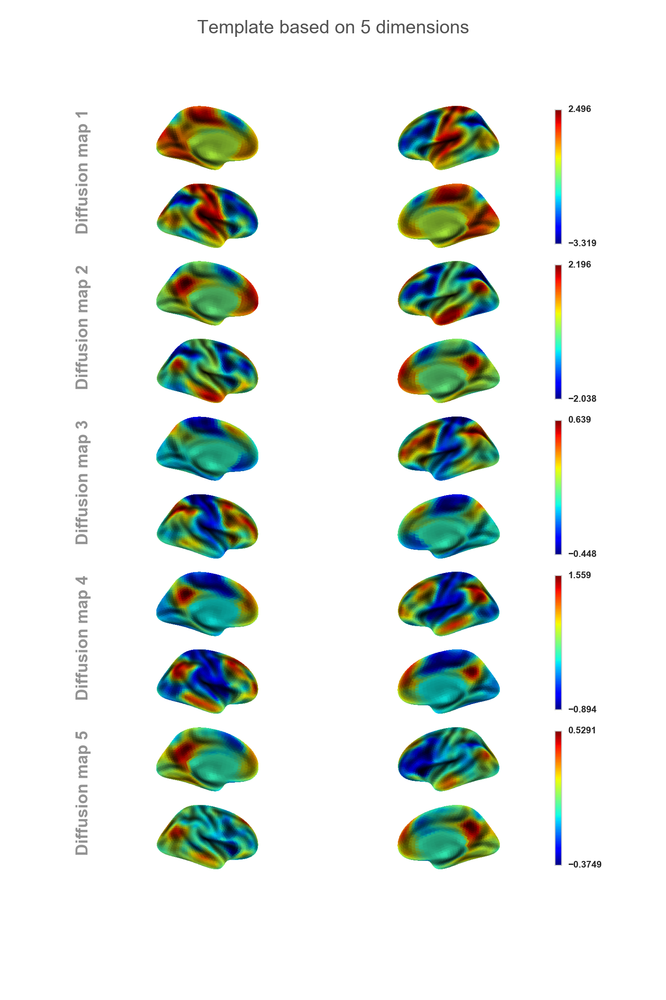

In [129]:
create_template_fig(e3b_5d_template_fs4[0:5124,:], n_comps=5, cbar=True, title = "Template based on 5 dimensions")

#### Plot example subject

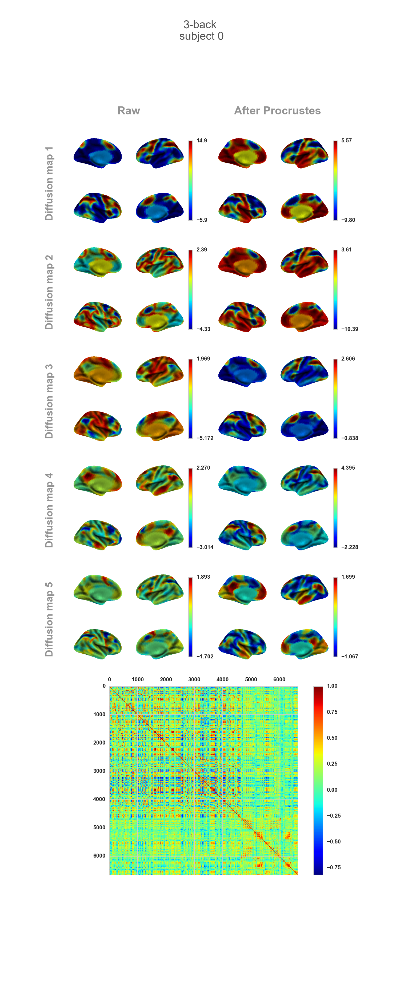

In [132]:
i = 0
create_dense_fig(e3b_native_fs4[i,0:5124,:], e3b_5d_realigned_fs4[i,0:5124,:], cbar=True, n_comps=5, title = "3-back\n subject %d" % i, subj = i)

Reducing the number of dimensions does not alleviate the problem

## Group template + Hungarian algorithm

This is an alternative approach to using Procrustes analysis to align the subjects. Here we first create a group-level template for the task and then use the Hungarian Method to assign individual embeddings to template maps. This is simpler version of Procrustes, because we are only allowed to flip sings (reflect) and swap dimensions. Thus, the procedure has been labeled 'flipswap'.

### Group-level consensus matrix

Here I use the common approach in which individual matrices are thresholded to retain only 10% of strongest connections, binarized, added together and divided by the number of matrices. This produces a 'consensus matrix', which represents the most commonly encountered connections at the group level.

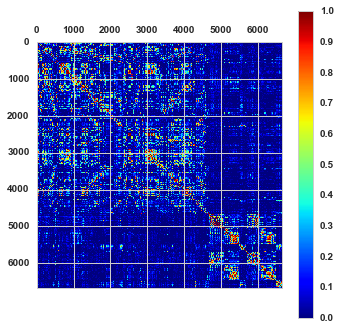

In [14]:
N = 29
gmat_cons = np.zeros([6663,6663])

for i in range(N):
    cmat_3b = np.load('corrmats/3back/subject%d_3back.npy' % i) # load the correlation matrix
    thr = np.percentile(cmat_3b,90)
    cmat_3b[cmat_3b > thr] = 1
    cmat_3b[cmat_3b <= thr] = 0
    gmat_cons = gmat_cons + cmat_3b

gmat_cons = gmat_cons/N
_ = plt.matshow(gmat_cons,cmap='jet')
_ = plt.colorbar()

#### Embed the consensus matrix to create a template and get it to fsaverage4 space

Sigma was set to 136.470868


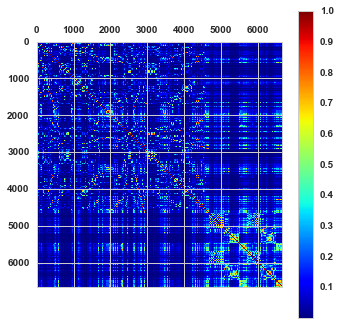

In [16]:
aff_cons = dist.compute_affinity(gmat_cons)
_ = plt.matshow(aff_cons, cmap = 'jet')
_ = plt.colorbar()
emb_tpl_cons = embed.compute_diffusion_map(aff_cons, n_components = 20)
e3b_gt_cons_fs4 = np.zeros([7126,20])
e3b_gt_cons_fs4[vv,:] = emb_tpl_cons[0]

#### Show the consensus-based template

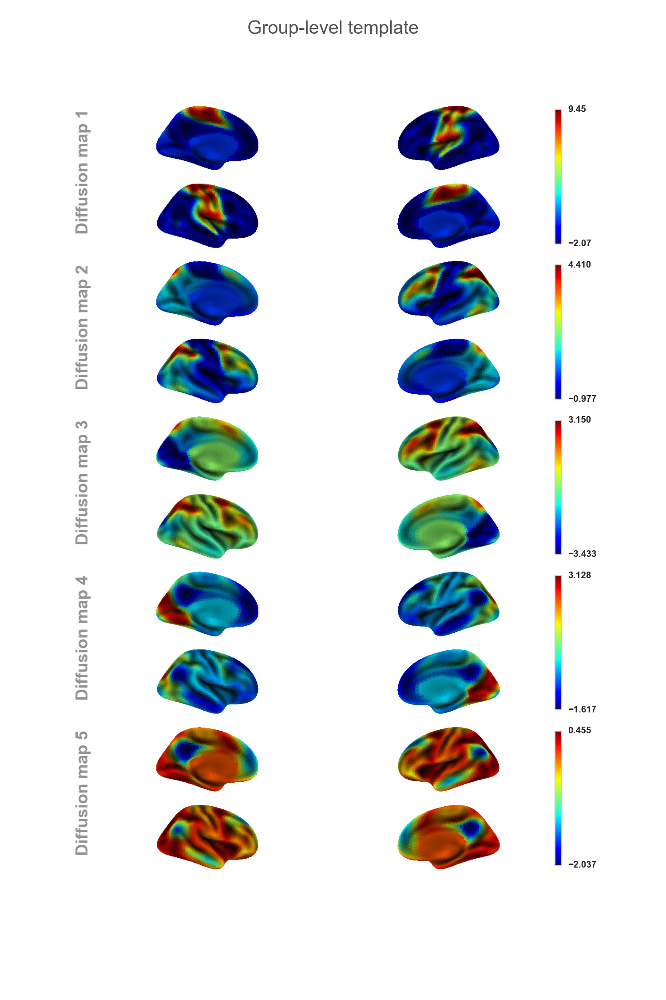

In [17]:
#e3b_gt_fs4[:,1:5] = e3b_gt_fs4[:,1:5]*-1
create_template_fig(e3b_gt_cons_fs4[0:5124,:], n_comps=5, cbar=True, title = "Group-level template")

### Mean group-level connectivity matrix

This is an alternative version based on averaging full Fisher-transformed correlation matrices. The input matrix looks very different from the consensus matrix.

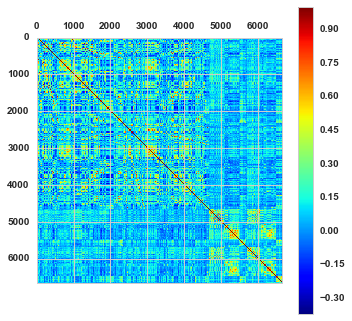

In [15]:
N = 29
gmat_avg = np.zeros([6663,6663])

for i in range(N):
    cmat_3b = np.load('corrmats/3back/subject%d_3back.npy' % i) # load the correlation matrix
    cmat_3b = np.arctanh(cmat_3b)
    gmat_avg = gmat_avg + cmat_3b

gmat_avg = gmat_avg/N
gmat_avg = np.tanh(gmat_avg)
np.fill_diagonal(gmat_avg, 1)
_ = plt.matshow(gmat_avg,cmap='jet')
_ = plt.colorbar()

#### Embed the average matrix to create a template and get it to fsaverage4 space

Sigma was set to 77.231800


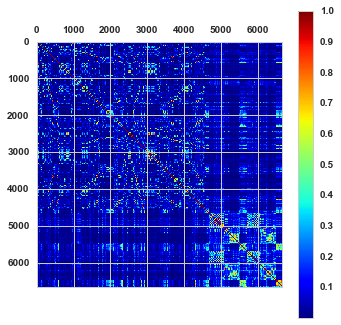

In [18]:
aff_avg = dist.compute_affinity(gmat_avg)
_ = plt.matshow(aff_avg, cmap = 'jet')
_ = plt.colorbar()
emb_tpl_avg = embed.compute_diffusion_map(aff_avg, n_components = 20)
e3b_gt_avg_fs4 = np.zeros([7126,20])
e3b_gt_avg_fs4[vv,:] = emb_tpl_avg[0]

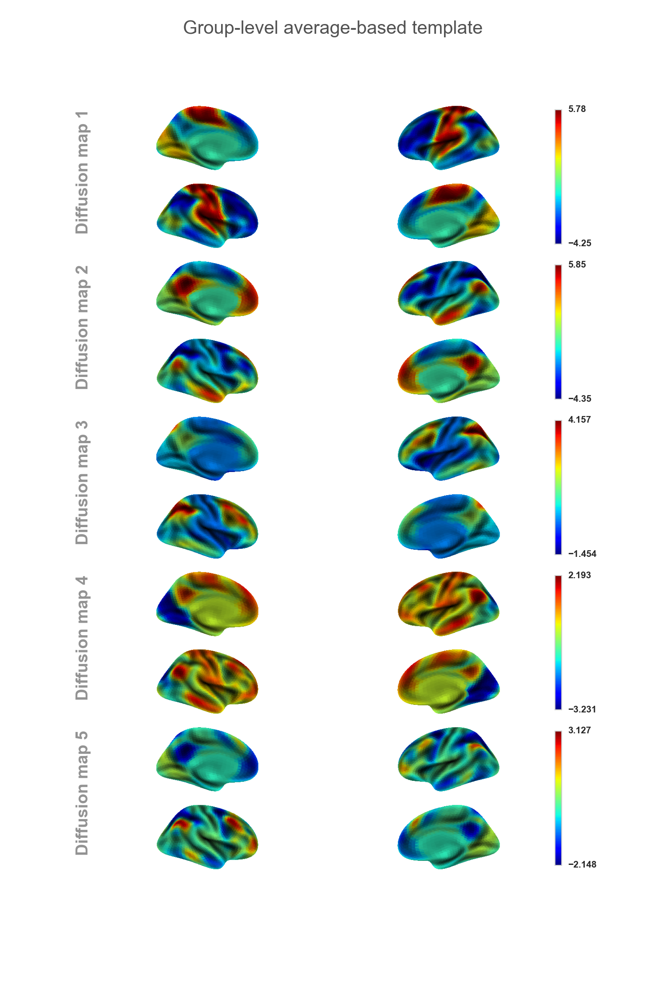

In [19]:
create_template_fig(e3b_gt_avg_fs4[0:5124,:], n_comps=5, cbar=True, title = "Group-level average-based template")

The template based on group-level consensus matrix looks different from what we get by averaging the individual embeddings. This raises an obvious question - what are we looking at?

I would say DM1-3 from the template based on averaged matrix represent the most interesting gradients for the working memory task. It should reflect the FPN/DMN separation during the task. Thus we might try to find in each individual a map that resembles this component to the largest degree.

### The flipswap method

In [20]:
from munkres import Munkres
m = Munkres()

def eta_squared(x,y):
    m_i = np.mean([x,y],axis=0)
    M = np.mean(m_i)

    numerator = np.sum(np.power(x-m_i,2) + np.power(y-m_i,2))
    denominator = np.sum(np.power(x-M,2) + np.power(y-M,2))
    
    eta_sq = numerator/denominator
    
    return eta_sq

def generate_similarity(source, target):
    
    from scipy.spatial.distance import euclidean
    
    ncols = source.shape[1]
    ncol = target.shape[1]
    
    # Put together embeddings and their flipped versions
    sources = np.concatenate([source,source*-1],axis=1)
    
    # Initiate final structures
    smat = np.zeros((ncol,ncols*2))
    smat_sq = np.zeros((ncol,ncols))
    fmat = np.ones((ncol,ncols))
    
    # Calculate eta-squared between each target and source eigenvector
    for i in range(ncol):
        for j in range(ncols*2):
            smat[i,j] = 2-(np.corrcoef(target[:,i],sources[:,j])[0,1]+1)
            #smat[i,j] = euclidean(target[:,i],sources[:,j])
            #smat[i,j] = eta_squared(sources[:,j],target[:,i])
    
    # For each source embedding check out if the regular of flipped version is more similar to the target
    for i in range(ncol):
        for j in range(ncols):
            if smat[i,j+20] < smat[i,j]:
                fmat[i,j] = -1
                smat_sq[i,j] = smat[i,j+20]
            else:
                smat_sq[i,j] = smat[i,j]
    
    fmat = fmat.astype('int')
    indexes = m.compute(smat_sq)
    source_realigned = np.zeros(target.shape)
    
    for i in range(len(indexes)):
        source_realigned[:,i] = sources[:,indexes[i][1]]*fmat[i,indexes[i][1]]
    
    return source_realigned

#### Plot example subject

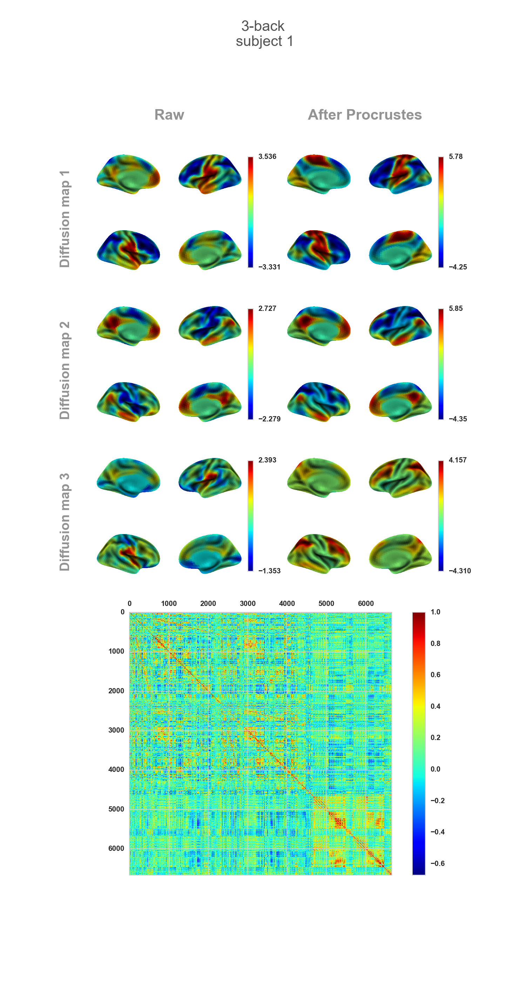

In [28]:
i = 1
sr = generate_similarity(e3b_native_fs4[i,:,:], e3b_gt_avg_fs4[:,0:3])
create_dense_fig(sr[0:5124,:], e3b_gt_avg_fs4[:,0:3], cbar=True, n_comps=3, title = "3-back\n subject %d" % i, subj = i)

#### Generate PDF report

In [30]:
pdf = PdfPages('3back_flipswap2.pdf')
for i in range(29):
    sr = generate_similarity(e3b_native_fs4[i,:,:], e3b_gt_avg_fs4[:,0:3])
    create_dense_fig(sr[0:5124,:], e3b_gt_fs4[:,0:3], cbar=True, n_comps=3, title = "3-back\n subject %d" % i, pdf = pdf, subj = i)
pdf.close()

### Use SVD for a single component to further reduce dimensionality

The idea behind this part is that if we found a component that seems to be consistent with what we believe should differentiate between subject, we could use SVD to investigate that further. Girst eigenvector should extract what is common for all subjects, so it should resemble the component we have entered into SVD. The following components should express brain areas that vary between subjects. Most importantly, the right singular vectors give us weights for the subjects. We can use these for correlations with behavior. Thus we end up with a single value per subject describing it's relation to the rest of the group!

#### Aggregate the same component (is this case the second diffusion map) for all subjects into one matrix

In [108]:
aggmat = np.zeros([7126,27])
inds = range(29)
inds.pop(3)
inds.pop(10)

for ind, i in enumerate(inds):
    sr = generate_similarity(e3b_native_fs4[i,:,:], e3b_gt_avg_fs4[:,0:3])
    aggmat[:,ind] = sr[:,1]

aggmat = aggmat[vv,:]

#### Decompose the matrix and plot singular values

In [158]:
u, s, v = np.linalg.svd(aggmat, full_matrices=False)

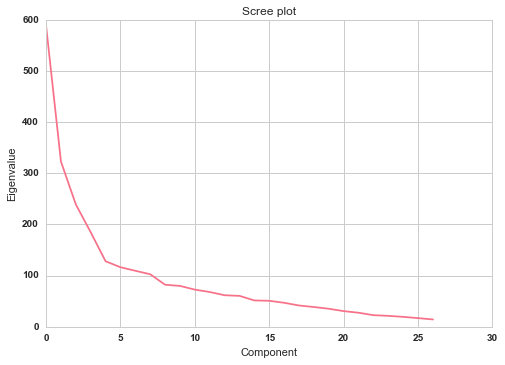

In [136]:
_ = plt.plot(s)
_ = plt.title("Scree plot")
_ = plt.xlabel("Component")
_ = plt.ylabel("Eigenvalue")

#### Get back to the original space and plot left singular vectors

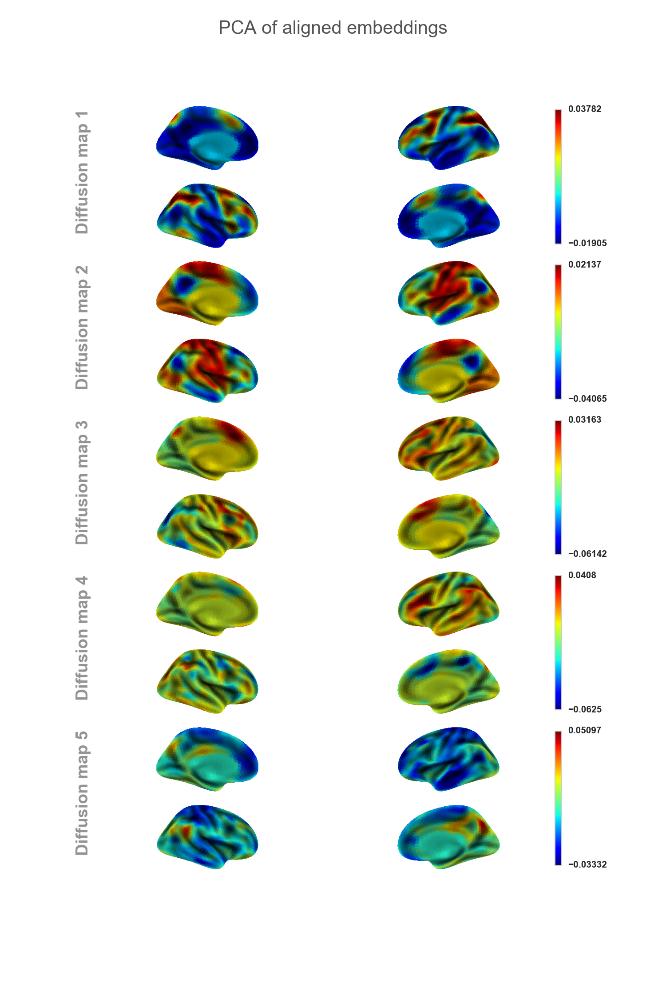

In [112]:
u_fs4 = np.zeros([7126,6663])
u_fs4[vv,:] = u

create_template_fig(u_fs4[0:5124,:], n_comps=5, cbar=True, title = "PCA of aligned embeddings")

#### Get behavioral data, remove outliers and plot it against right singular vectors

In [72]:
dm_3b = np.genfromtxt('dm_3b.csv',delimiter=',')
inds2 = range(28)
inds2.pop(3)

Spearman correlation for component 1: rho = -0.076641, p = 0.703979
Spearman correlation for component 2: rho = 0.047023, p = 0.815835
Spearman correlation for component 3: rho = 0.238779, p = 0.230347
Spearman correlation for component 4: rho = 0.012214, p = 0.951786
Spearman correlation for component 5: rho = -0.401527, p = 0.037899


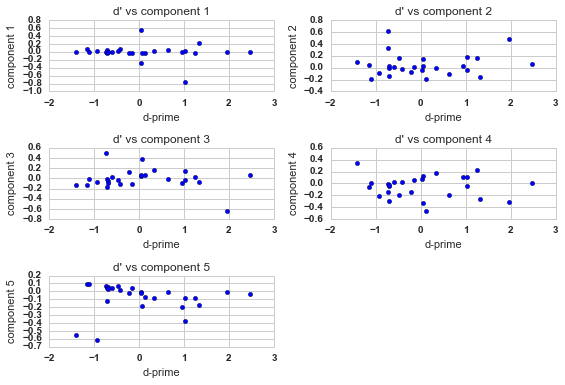

In [156]:
fig = plt.figure(1)

for i in range(0,5):
    plt.subplot(3,2,i+1)
    plt.scatter(dm_3b[inds2,1],v[:,i])
    plt.title("d' vs component %d" % (i+1))
    plt.xlabel('d-prime')
    plt.ylabel('component %d' % (i+1))

plt.tight_layout()

for i in range(5):
    x = stats.spearmanr(dm_3b[inds2,1],v[:,i])
    print "Spearman correlation for component %d: rho = %f, p = %f" % (i+1, x[0], x[1])